# Deep dive into zipline

## Importing libraries

In [1]:
%load_ext watermark

In [2]:
%load_ext zipline

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # 그래프를 더 높은 해상도로 출력

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import zipline
from trading_calendars import get_calendar
# from yahoofinancials import YahooFinancials
import warnings

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 200
warnings.simplefilter(action='ignore', category=FutureWarning)

In [5]:
%watermark --iversions

numpy   1.14.3
zipline v1.3.0
pandas  0.22.0



## Basic Example

In [6]:
%%zipline --start 2019-1-2 --end 2019-12-30 --capital-base 200 --bundle krx_futures -o zl_basic.pkl --trading-calendar XKRX

# imports
from zipline.api import order_percent, order, record, symbol, set_benchmark, set_slippage
from zipline.finance import commission, slippage

# parameters
SELECTED_STOCK = 'LKTB'
n_stocks_to_buy = 1 # order_percent 로 변경하며 주석처리

def initialize(context):
    set_benchmark(symbol('LKTB'))
    context.asset = symbol(SELECTED_STOCK)
    context.has_ordered = False
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.set_slippage(slippage.FixedSlippage(spread=0))

def handle_data(context, data):
    
    # trading logic
    if not context.has_ordered:
        # placing order, negative number for sale/short
        order(context.asset, n_stocks_to_buy)
        #order_percent(context.asset, 1)
        # setting up a flag for holding a position
        context.has_ordered = True
        
    # record price for further inspection
    record(price=data.current(context.asset, 'price'))

C:\ProgramData\Anaconda3\envs\backtest\lib\site-packages\empyrical\stats.py:790: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
C:\ProgramData\Anaconda3\envs\backtest\lib\site-packages\empyrical\stats.py:704: RuntimeWarning: invalid value encountered in true_divide
  out=out,


,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2019-01-02 06:30:00+00:00,NaN,0.000000,NaN,0.000313,NaN,NaN,0.00,200.00,0.000,0.000,...,0.0,0.0,0,NaN,200.00,0.000,0.000,1,[],0.0
2019-01-03 06:30:00+00:00,0.000000,0.000000,0.000000,-0.000861,0.016691,0.000000,-127.64,72.36,127.640,127.640,...,0.0,0.0,0,NaN,200.00,0.000,0.000,2,"[{'sid': Equity(1 [LKTB]), 'commission': None,...",0.0
2019-01-04 06:30:00+00:00,0.003208,-0.000350,-0.026475,-0.001409,0.011852,0.024714,0.00,72.36,127.570,127.570,...,0.0,0.0,0,-9.165151,72.36,127.640,127.640,3,[],0.0
2019-01-07 06:30:00+00:00,0.005670,-0.001100,-0.029597,-0.002583,0.011183,0.243902,0.00,72.36,127.420,127.420,...,0.0,0.0,0,-10.548640,72.36,127.570,127.570,4,[],0.0
2019-01-08 06:30:00+00:00,0.006623,-0.002000,-0.024034,-0.003992,0.011108,0.381326,0.00,72.36,127.240,127.240,...,0.0,0.0,0,-11.611292,72.36,127.420,127.420,5,[],0.0
2019-01-09 06:30:00+00:00,0.007271,-0.001750,-0.006420,-0.003601,0.012587,0.443293,0.00,72.36,127.290,127.290,...,0.0,0.0,0,-9.272836,72.36,127.240,127.240,6,[],0.0
2019-01-10 06:30:00+00:00,0.010677,-0.000650,0.012836,-0.001879,0.018092,0.535830,0.00,72.36,127.510,127.510,...,0.0,0.0,0,-3.181570,72.36,127.290,127.290,7,[],0.0
2019-01-11 06:30:00+00:00,0.012148,-0.002000,0.009462,-0.003992,0.019705,0.575919,0.00,72.36,127.240,127.240,...,0.0,0.0,0,-6.157686,72.36,127.510,127.510,8,[],0.0
2019-01-14 06:30:00+00:00,0.015541,-0.000250,0.013809,-0.001252,0.025209,0.594788,0.00,72.36,127.590,127.590,...,0.0,0.0,0,-0.714753,72.36,127.240,127.240,9,[],0.0
2019-01-15 06:30:00+00:00,0.014889,0.000250,0.013274,-0.000470,0.024214,0.593962,0.00,72.36,127.690,127.690,...,0.0,0.0,0,0.699376,72.36,127.590,127.590,10,[],0.0


In [7]:
# read the performance summary dataframe
zl_basic = pd.read_pickle('zl_basic.pkl')

In [8]:
zl_basic.to_csv("zl_basic_200.csv")

In [9]:
zl_basic

,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2019-01-02 06:30:00+00:00,NaN,0.000000,NaN,0.000313,NaN,NaN,0.00,200.00,0.000,0.000,...,0.0,0.0,0,NaN,200.00,0.000,0.000,1,[],0.0
2019-01-03 06:30:00+00:00,0.000000,0.000000,0.000000,-0.000861,0.016691,0.000000,-127.64,72.36,127.640,127.640,...,0.0,0.0,0,NaN,200.00,0.000,0.000,2,"[{'commission': None, 'dt': 2019-01-03 06:30:0...",0.0
2019-01-04 06:30:00+00:00,0.003208,-0.000350,-0.026475,-0.001409,0.011852,0.024714,0.00,72.36,127.570,127.570,...,0.0,0.0,0,-9.165151,72.36,127.640,127.640,3,[],0.0
2019-01-07 06:30:00+00:00,0.005670,-0.001100,-0.029597,-0.002583,0.011183,0.243902,0.00,72.36,127.420,127.420,...,0.0,0.0,0,-10.548640,72.36,127.570,127.570,4,[],0.0
2019-01-08 06:30:00+00:00,0.006623,-0.002000,-0.024034,-0.003992,0.011108,0.381326,0.00,72.36,127.240,127.240,...,0.0,0.0,0,-11.611292,72.36,127.420,127.420,5,[],0.0
2019-01-09 06:30:00+00:00,0.007271,-0.001750,-0.006420,-0.003601,0.012587,0.443293,0.00,72.36,127.290,127.290,...,0.0,0.0,0,-9.272836,72.36,127.240,127.240,6,[],0.0
2019-01-10 06:30:00+00:00,0.010677,-0.000650,0.012836,-0.001879,0.018092,0.535830,0.00,72.36,127.510,127.510,...,0.0,0.0,0,-3.181570,72.36,127.290,127.290,7,[],0.0
2019-01-11 06:30:00+00:00,0.012148,-0.002000,0.009462,-0.003992,0.019705,0.575919,0.00,72.36,127.240,127.240,...,0.0,0.0,0,-6.157686,72.36,127.510,127.510,8,[],0.0
2019-01-14 06:30:00+00:00,0.015541,-0.000250,0.013809,-0.001252,0.025209,0.594788,0.00,72.36,127.590,127.590,...,0.0,0.0,0,-0.714753,72.36,127.240,127.240,9,[],0.0
2019-01-15 06:30:00+00:00,0.014889,0.000250,0.013274,-0.000470,0.024214,0.593962,0.00,72.36,127.690,127.690,...,0.0,0.0,0,0.699376,72.36,127.590,127.590,10,[],0.0


## Pyfolio tearsheets

Start date,2019-01-02
End date,2019-12-30
Total months,11
,Backtest
Annual return,1.4%
Cumulative returns,1.3%
Annual volatility,2.7%
Sharpe ratio,0.50
Calmar ratio,0.38
Stability,0.37
Max drawdown,-3.6%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,3.59,2019-08-16,2019-11-12,NaT,NaN
1,0.73,2019-03-28,2019-04-17,2019-05-23,41
2,0.50,2019-01-15,2019-01-30,2019-02-11,20
3,0.45,2019-02-11,2019-03-04,2019-03-21,29
4,0.40,2019-06-20,2019-06-27,2019-07-03,10


Stress Events,mean,min,max
New Normal,0.01%,-0.73%,0.65%


Top 10 long positions of all time,max
sid,
LKTB,65.26%


Top 10 short positions of all time,max
sid,


Top 10 positions of all time,max
sid,
LKTB,65.26%


C:\ProgramData\Anaconda3\envs\backtest\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


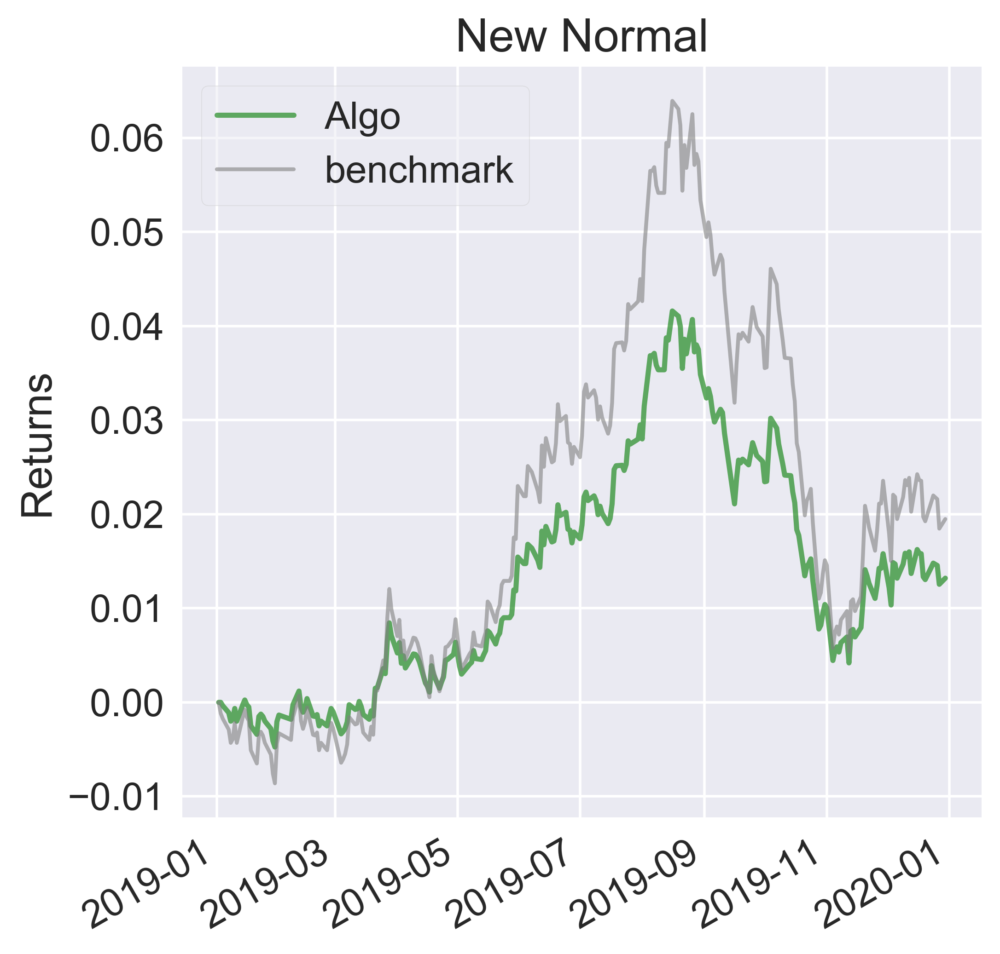

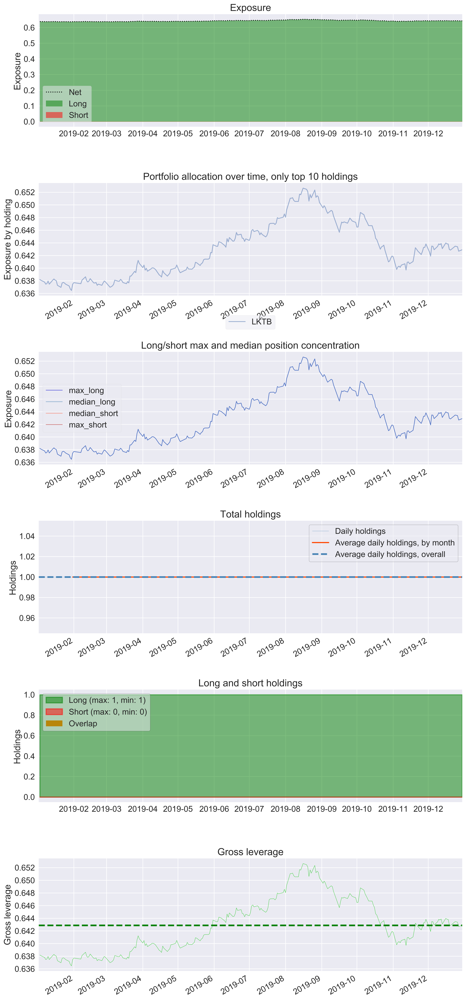

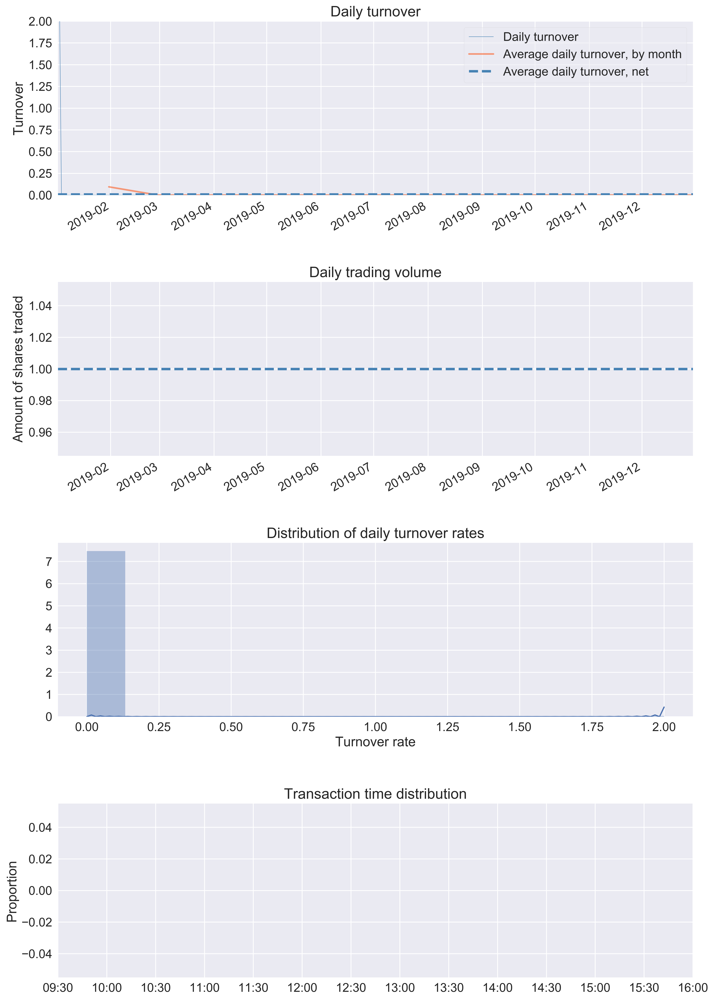

In [10]:
import pyfolio as pf
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(zl_basic)
benchmark_period_return = zl_basic['benchmark_period_return']
# Convert benchmark returns to daily returns
#daily_returns = (1 + benchmark_period_return) / (1 + benchmark_period_return.shift()) - 1
daily_benchmark_returns = np.exp(np.log(benchmark_period_return + 1.0).diff()) - 1
sheets = pf.create_full_tear_sheet(returns, positions=positions, transactions=transactions, benchmark_rets=daily_benchmark_returns)

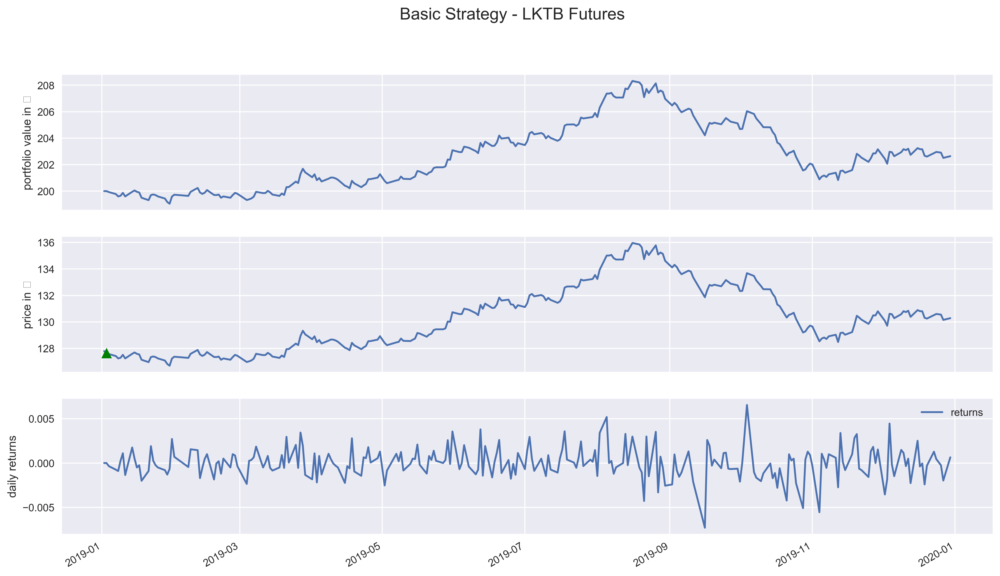

Final portfolio value (including cash): 202.64￦


In [11]:
# import helper functions 
import qf_helper_functions as qf

qf.visualize_results(zl_basic, 'Basic Strategy - LKTB Futures', '￦')

In [12]:
returns

2019-01-02 00:00:00+00:00    0.000000
2019-01-03 00:00:00+00:00    0.000000
2019-01-04 00:00:00+00:00   -0.000350
2019-01-07 00:00:00+00:00   -0.000750
2019-01-08 00:00:00+00:00   -0.000901
2019-01-09 00:00:00+00:00    0.000251
2019-01-10 00:00:00+00:00    0.001102
2019-01-11 00:00:00+00:00   -0.001351
2019-01-14 00:00:00+00:00    0.001754
2019-01-15 00:00:00+00:00    0.000500
2019-01-16 00:00:00+00:00   -0.000500
2019-01-17 00:00:00+00:00   -0.000250
2019-01-18 00:00:00+00:00   -0.002001
2019-01-21 00:00:00+00:00   -0.000902
2019-01-22 00:00:00+00:00    0.001906
2019-01-23 00:00:00+00:00    0.000250
2019-01-24 00:00:00+00:00   -0.000250
2019-01-25 00:00:00+00:00   -0.000501
2019-01-28 00:00:00+00:00   -0.000802
2019-01-29 00:00:00+00:00   -0.001304
2019-01-30 00:00:00+00:00   -0.000653
2019-01-31 00:00:00+00:00    0.002713
2019-02-01 00:00:00+00:00    0.000701
2019-02-07 00:00:00+00:00   -0.000451
2019-02-08 00:00:00+00:00    0.001553
2019-02-11 00:00:00+00:00    0.001450
2019-02-12 0

In [13]:
import pyfolio as pf

# possible additional summary statistics
pf.create_simple_tear_sheet(buy_and_hold_results.returns)

NameError: name 'buy_and_hold_results' is not defined

In [13]:
buy_and_hold_perf = qf.get_performance_summary(buy_and_hold_results.returns)

NameError: name 'buy_and_hold_results' is not defined

### Simple Moving Average Strategy

In [14]:
%%zipline --start 2019-1-2 --end 2019-12-30 --capital-base 10000 --bundle krx_futures -o simple_moving_average.pkl --trading-calendar XKRX

# imports 
from zipline.api import order_percent, record, symbol, order_target
from zipline.finance import commission

# parameters 
MA_PERIODS = 20
SELECTED_STOCK = 'LKTB'

def initialize(context):
    context.asset = symbol(SELECTED_STOCK)
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.has_position = False

def handle_data(context, data):
    
    price_history = data.history(context.asset, fields="price", bar_count=MA_PERIODS, frequency="1d")
    ma = price_history.mean()
    
    # cross up
    if (price_history[-2] < ma) & (price_history[-1] > ma) & (not context.has_position):
        order_percent(context.asset, 1.0)
        context.has_position = True
    # cross down
    elif (price_history[-2] > ma) & (price_history[-1] < ma) & (context.has_position):
        order_target(context.asset, 0)
        context.has_position = False

    record(price=data.current(context.asset, 'price'),
           moving_average=ma)

C:\ProgramData\Anaconda3\envs\backtest\lib\site-packages\empyrical\stats.py:790: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
C:\ProgramData\Anaconda3\envs\backtest\lib\site-packages\empyrical\stats.py:704: RuntimeWarning: invalid value encountered in true_divide
  out=out,


,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2019-01-02 06:30:00+00:00,NaN,0.000000,None,0.0,NaN,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,1,[],0.0
2019-01-03 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,2,[],0.0
2019-01-04 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,3,[],0.0
2019-01-07 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,4,[],0.0
2019-01-08 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,5,[],0.0
2019-01-09 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,6,[],0.0
2019-01-10 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,7,[],0.0
2019-01-11 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,8,[],0.0
2019-01-14 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,9,[],0.0
2019-01-15 06:30:00+00:00,0.002500,-0.000498,None,0.0,0.0,None,-9964.799910,35.200090,9959.820,9959.820,...,0.0,0.0,0,-5.019960,10000.000000,0.000,0.000,10,"[{'sid': Equity(1 [LKTB]), 'commission': None,...",0.0


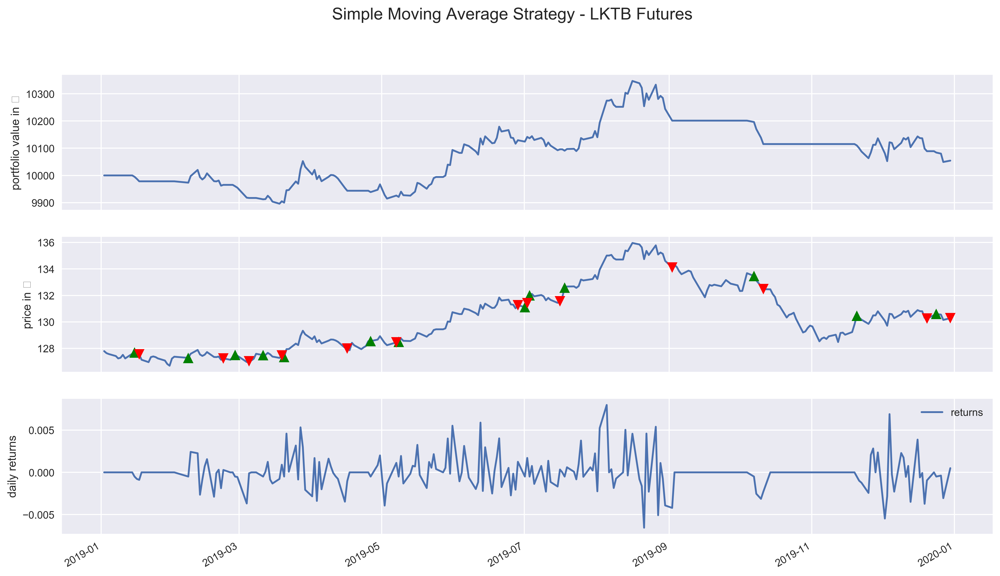

Final portfolio value (including cash): 10054.37￦


In [15]:
sma_results = pd.read_pickle('simple_moving_average.pkl')
qf.visualize_results(sma_results, 'Simple Moving Average Strategy - LKTB Futures', '￦')

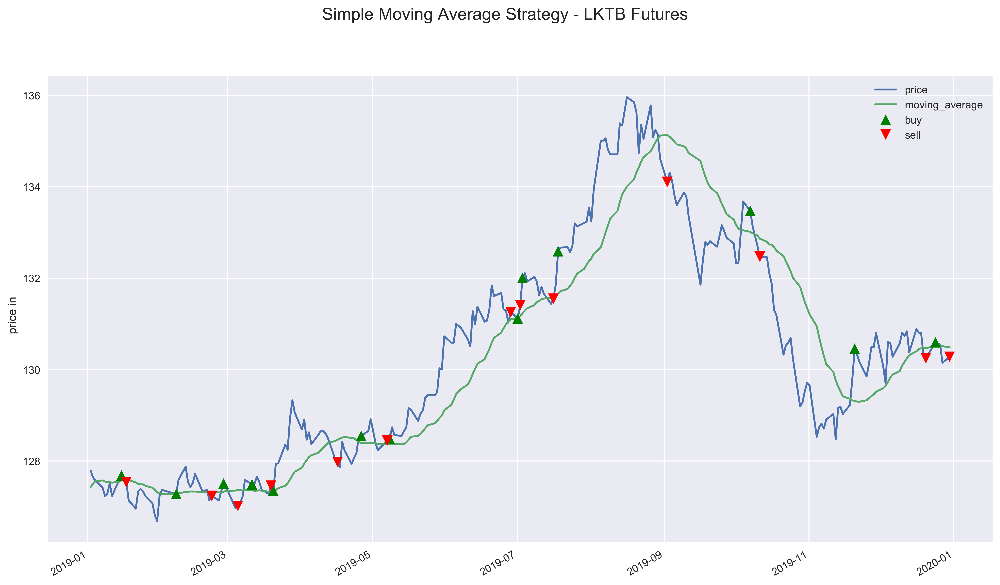

In [16]:
fig, ax = plt.subplots()

# asset
sma_results[['price', 'moving_average']].plot(ax=ax)
ax.set_ylabel('price in ￦')

# mark transactions
perf_trans = sma_results.loc[[t != [] for t in sma_results.transactions]]
buys = perf_trans.loc[[t[0]['amount'] > 0 for t in perf_trans.transactions]]
sells = perf_trans.loc[[t[0]['amount'] < 0 for t in perf_trans.transactions]]
ax.plot(buys.index, sma_results.price.loc[buys.index], '^', markersize=10, color='g', label='buy')
ax.plot(sells.index, sma_results.price.loc[sells.index], 'v', markersize=10, color='r', label='sell')
ax.legend()

fig.suptitle('Simple Moving Average Strategy - LKTB Futures', fontsize=16)
plt.legend()
plt.show()

In [17]:
sma_perf = qf.get_performance_summary(sma_results.returns)

In [18]:
%%zipline --start 2019-1-2 --end 2019-12-30 --capital-base 10000 --bundle krx_futures -o moving_average_crossover.pkl --trading-calendar XKRX

# imports 
from zipline.api import order_percent, record, symbol, order_target
from zipline.finance import commission

# parameters 
SELECTED_STOCK = 'LKTB'
SLOW_MA_PERIODS = 100
FAST_MA_PERIODS = 20

def initialize(context):
    context.asset = symbol(SELECTED_STOCK)
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.has_position = False
    
def handle_data(context, data):

    fast_ma = data.history(context.asset, 'price', bar_count=FAST_MA_PERIODS, frequency="1d").mean()
    slow_ma = data.history(context.asset, 'price', bar_count=SLOW_MA_PERIODS, frequency="1d").mean()

    # Trading logic
    if (fast_ma > slow_ma) & (not context.has_position):
        order_percent(context.asset, 1.0)
        context.has_position = True
    elif (fast_ma < slow_ma) & (context.has_position):
        order_target(context.asset, 0)
        context.has_position = False

    record(price=data.current(context.asset, 'price'),
           fast_ma=fast_ma,
           slow_ma=slow_ma)

,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_value,shorts_count,slow_ma,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2019-01-02 06:30:00+00:00,NaN,0.000000,None,0.0,NaN,None,0.00000,10000.00000,0.00,0.00,...,0.0,0,124.66070,NaN,10000.00000,0.00,0.00,1,[],0.0
2019-01-03 06:30:00+00:00,0.005588,-0.000498,None,0.0,0.0,None,-9960.89796,39.10204,9955.92,9955.92,...,0.0,0,124.72460,-11.224972,10000.00000,0.00,0.00,2,"[{'sid': Equity(1 [LKTB]), 'commission': None,...",0.0
2019-01-04 06:30:00+00:00,0.004800,-0.001044,None,0.0,0.0,None,0.00000,39.10204,9950.46,9950.46,...,0.0,0,124.78580,-12.947533,39.10204,9955.92,9955.92,3,[],0.0
2019-01-07 06:30:00+00:00,0.007619,-0.002214,None,0.0,0.0,None,0.00000,39.10204,9938.76,9938.76,...,0.0,0,124.84560,-12.696364,39.10204,9950.46,9950.46,4,[],0.0
2019-01-08 06:30:00+00:00,0.008957,-0.003618,None,0.0,0.0,None,0.00000,39.10204,9924.72,9924.72,...,0.0,0,124.90350,-13.025496,39.10204,9938.76,9938.76,5,[],0.0
2019-01-09 06:30:00+00:00,0.010793,-0.003228,None,0.0,0.0,None,0.00000,39.10204,9928.62,9928.62,...,0.0,0,124.95800,-10.605768,39.10204,9924.72,9924.72,6,[],0.0
2019-01-10 06:30:00+00:00,0.016762,-0.001512,None,0.0,0.0,None,0.00000,39.10204,9945.78,9945.78,...,0.0,0,125.01250,-4.587192,39.10204,9928.62,9928.62,7,[],0.0
2019-01-11 06:30:00+00:00,0.018809,-0.003618,None,0.0,0.0,None,0.00000,39.10204,9924.72,9924.72,...,0.0,0,125.06480,-7.029800,39.10204,9945.78,9945.78,8,[],0.0
2019-01-14 06:30:00+00:00,0.024390,-0.000888,None,0.0,0.0,None,0.00000,39.10204,9952.02,9952.02,...,0.0,0,125.12040,-1.609417,39.10204,9924.72,9924.72,9,[],0.0
2019-01-15 06:30:00+00:00,0.023414,-0.000108,None,0.0,0.0,None,0.00000,39.10204,9959.82,9959.82,...,0.0,0,125.17430,-0.170310,39.10204,9952.02,9952.02,10,[],0.0


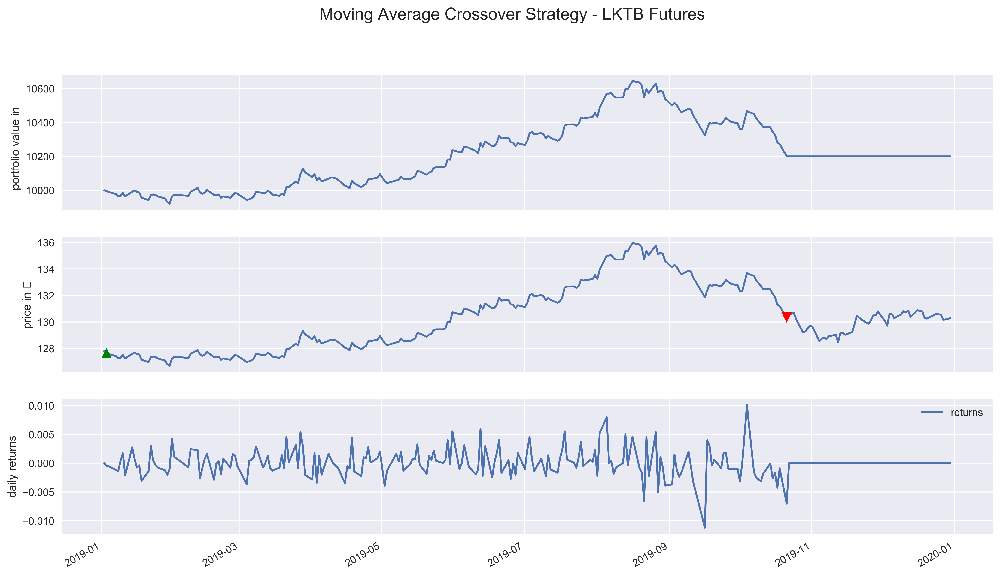

Final portfolio value (including cash): 10199.76￦


In [19]:
mac_results = pd.read_pickle('moving_average_crossover.pkl')
qf.visualize_results(mac_results, 'Moving Average Crossover Strategy - LKTB Futures', '￦')

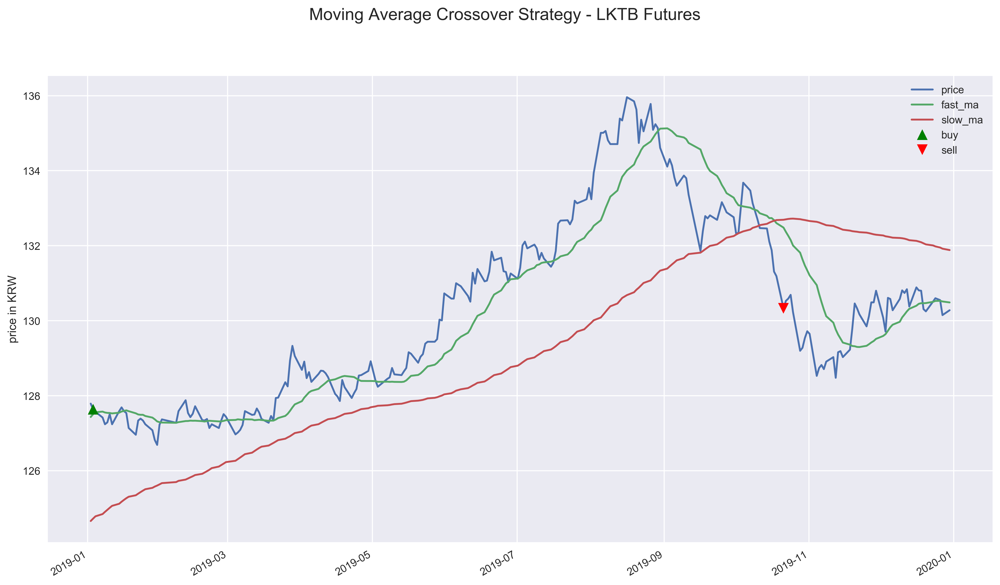

In [20]:
fig, ax = plt.subplots()

# asset
mac_results[['price', 'fast_ma', 'slow_ma']].plot(ax=ax)
ax.set_ylabel('price in KRW')

# mark transactions
perf_trans = mac_results.loc[[t != [] for t in mac_results.transactions]]
buys = perf_trans.loc[[t[0]['amount'] > 0 for t in perf_trans.transactions]]
sells = perf_trans.loc[[t[0]['amount'] < 0 for t in perf_trans.transactions]]
ax.plot(buys.index, mac_results.price.loc[buys.index], '^', markersize=10, color='g', label='buy')
ax.plot(sells.index, mac_results.price.loc[sells.index], 'v', markersize=10, color='r', label='sell')
ax.legend()

fig.suptitle('Moving Average Crossover Strategy - LKTB Futures', fontsize=16)
plt.legend()
plt.show()

In [21]:
mac_perf = qf.get_performance_summary(mac_results.returns)

### MACD

In [22]:
%%zipline --start 2019-1-2 --end 2019-12-30 --capital-base 10000 --bundle krx_futures -o macd.pkl --trading-calendar XKRX

# imports ----
from zipline.api import order_target, record, symbol, set_commission, order_percent
import matplotlib.pyplot as plt
import talib as ta
from zipline.finance import commission

# parameters ----
SELECTED_STOCK = 'LKTB'

 #initialize the strategy 
def initialize(context):
    context.asset = symbol(SELECTED_STOCK)
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.has_position = False
    
def handle_data(context, data):
    
    price_history = data.history(context.asset, fields="price", bar_count=34, frequency="1d")
    macd, macdsignal, macdhist = ta.MACD(price_history, 12, 26, 9) 
    
    if (macdsignal[-1] < macd[-1]) and (not context.has_position):
        order_percent(context.asset, 1.0)
        context.has_position = True
        
    if (macdsignal[-1] > macd[-1]) and (context.has_position):
        order_target(context.asset, 0)
        context.has_position = False
        
    record(macd =  macd[-1], macdsignal = macdsignal[-1], macdhist = macdhist[-1], price=price_history[-1]) 

C:\ProgramData\Anaconda3\envs\backtest\lib\site-packages\empyrical\stats.py:790: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
C:\ProgramData\Anaconda3\envs\backtest\lib\site-packages\empyrical\stats.py:704: RuntimeWarning: invalid value encountered in true_divide
  out=out,


,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2019-01-02 06:30:00+00:00,NaN,0.000000,None,0.0,NaN,None,0.00000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,1,[],0.0
2019-01-03 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.00000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,2,[],0.0
2019-01-04 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.00000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,3,[],0.0
2019-01-07 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.00000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,4,[],0.0
2019-01-08 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.00000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,5,[],0.0
2019-01-09 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.00000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,6,[],0.0
2019-01-10 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.00000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,7,[],0.0
2019-01-11 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.00000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,8,[],0.0
2019-01-14 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.00000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,9,[],0.0
2019-01-15 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.00000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,10,[],0.0


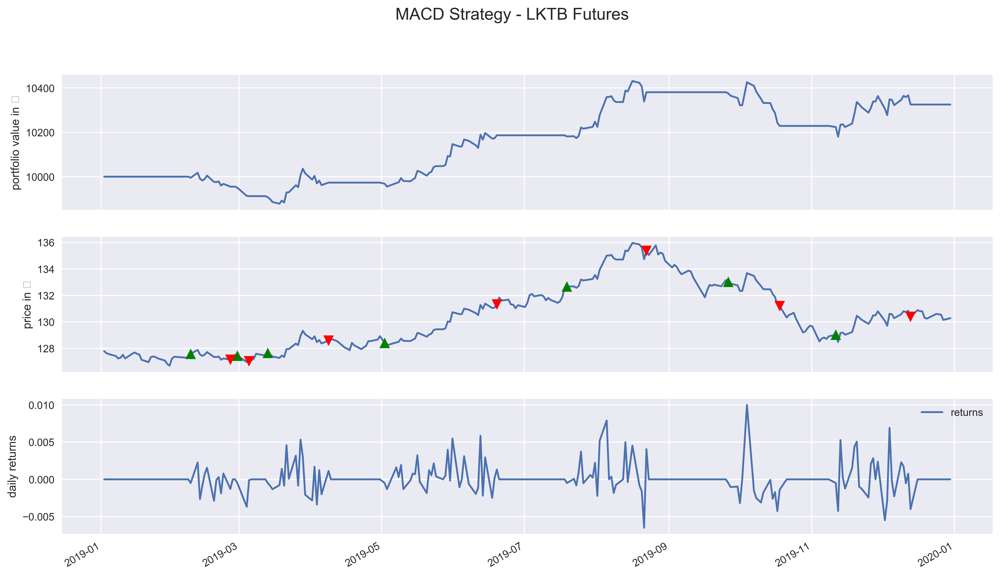

Final portfolio value (including cash): 10325.36￦


In [23]:
macd_results = pd.read_pickle('macd.pkl')
qf.visualize_results(macd_results, 'MACD Strategy - LKTB Futures', '￦')

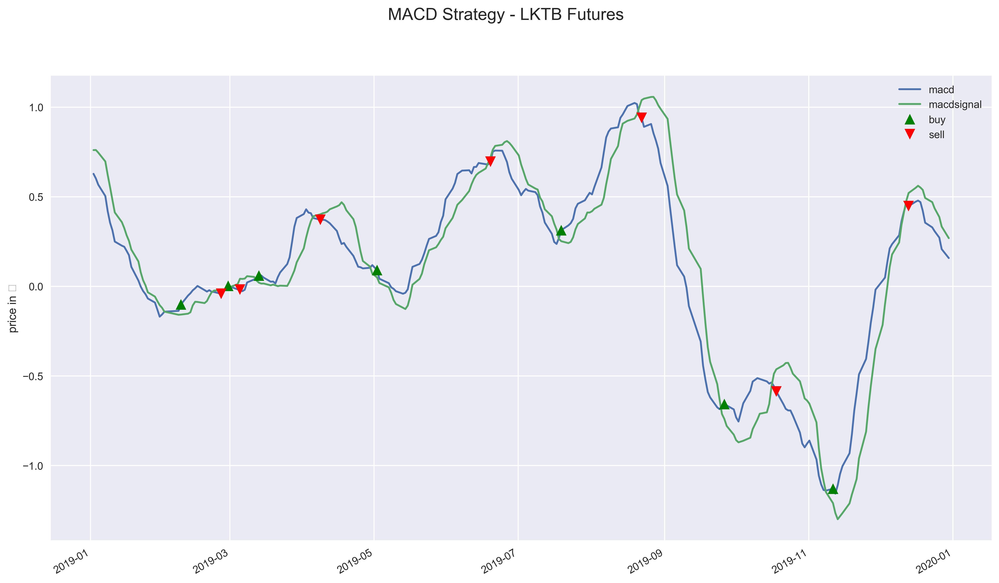

In [24]:
fig, ax = plt.subplots()

# asset
macd_results[['macd', 'macdsignal']].plot(ax=ax)
ax.set_ylabel('price in ￦')

# mark transactions
perf_trans = macd_results.loc[[t != [] for t in macd_results.transactions]]
buys = perf_trans.loc[[t[0]['amount'] > 0 for t in perf_trans.transactions]]
sells = perf_trans.loc[[t[0]['amount'] < 0 for t in perf_trans.transactions]]
ax.plot(buys.index, macd_results.macd.loc[buys.index], '^', markersize=10, color='g', label='buy')
ax.plot(sells.index, macd_results.macd.loc[sells.index], 'v', markersize=10, color='r', label='sell')
ax.legend()

fig.suptitle('MACD Strategy - LKTB Futures', fontsize=16)
plt.show()

In [25]:
macd_perf = qf.get_performance_summary(macd_results.returns)

### RSI

In [26]:
%%zipline --start 2019-1-2 --end 2019-12-30 --capital-base 10000 --bundle krx_futures -o rsi.pkl --trading-calendar XKRX

# imports ----
from zipline.api import order_target, record, symbol, set_commission, order_percent
import matplotlib.pyplot as plt
import talib as ta
from zipline.finance import commission

# parameters ----
SELECTED_STOCK = 'LKTB'
UPPER = 70
LOWER = 30
RSI_PERIOD = 14

#initialize the strategy 
def initialize(context):
    context.asset = symbol(SELECTED_STOCK)
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.has_position = False
    
def handle_data(context, data):
    
    price_history = data.history(context.asset, fields="price", bar_count=RSI_PERIOD+1, frequency="1d")
    rsi = ta.RSI(price_history, timeperiod=RSI_PERIOD)
    
    if rsi[-1] < LOWER and not context.has_position:
        order_percent(context.asset, 1.0)
        context.has_position = True
      
    if rsi[-1] > UPPER and context.has_position:
        order_target(context.asset, 0)
        context.has_position = False
     
    record(rsi=rsi[-1], price=price_history[-1]) 

C:\ProgramData\Anaconda3\envs\backtest\lib\site-packages\empyrical\stats.py:704: RuntimeWarning: invalid value encountered in true_divide
  out=out,
C:\ProgramData\Anaconda3\envs\backtest\lib\site-packages\empyrical\stats.py:790: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)


,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2019-01-02 06:30:00+00:00,NaN,0.000000,None,0.0,NaN,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,1,[],0.0
2019-01-03 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,2,[],0.0
2019-01-04 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,3,[],0.0
2019-01-07 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,4,[],0.0
2019-01-08 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,5,[],0.0
2019-01-09 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,6,[],0.0
2019-01-10 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,7,[],0.0
2019-01-11 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,8,[],0.0
2019-01-14 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,9,[],0.0
2019-01-15 06:30:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.000000,10000.000000,0.000,0.000,...,0.0,0.0,0,NaN,10000.000000,0.000,0.000,10,[],0.0


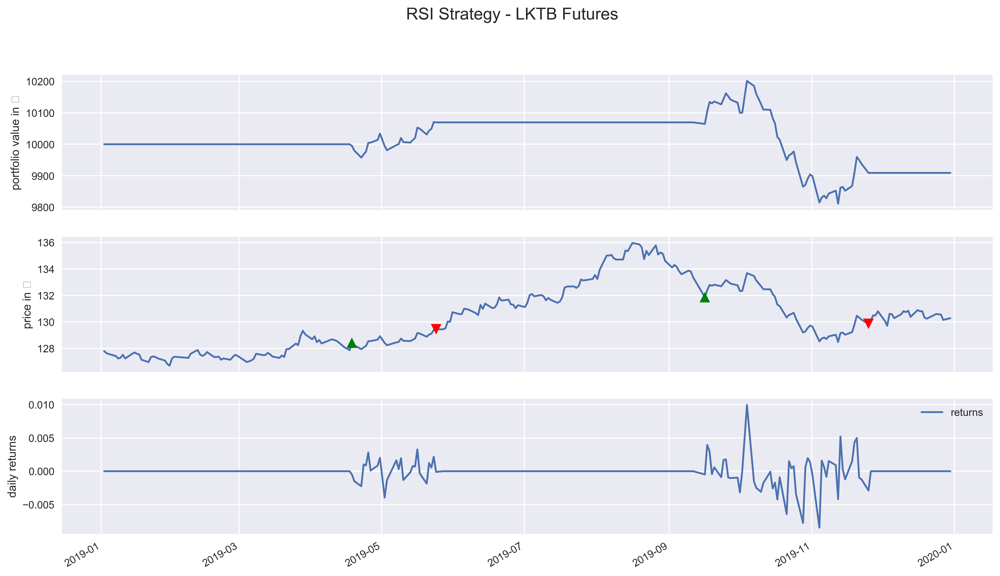

Final portfolio value (including cash): 9909.02￦


In [27]:
rsi_results = pd.read_pickle('rsi.pkl')
qf.visualize_results(rsi_results, 'RSI Strategy - LKTB Futures', '￦')

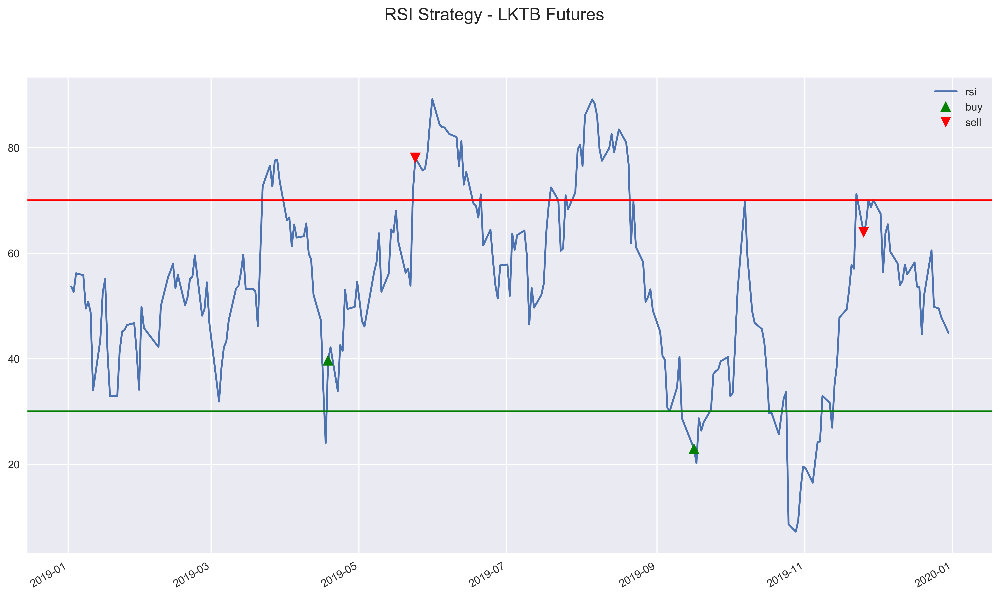

In [28]:
#fig, ax = plt.subplots(1, 1, sharex=True, figsize=[16, 9])
fig, ax = plt.subplots()

# asset
rsi_results[['rsi']].plot(ax=ax)
ax.axhline(y=70, color='r')
ax.axhline(y=30, color='g')

# mark transactions
perf_trans = rsi_results.loc[[t != [] for t in rsi_results.transactions]]
buys = perf_trans.loc[[t[0]['amount'] > 0 for t in perf_trans.transactions]]
sells = perf_trans.loc[[t[0]['amount'] < 0 for t in perf_trans.transactions]]
ax.plot(buys.index, rsi_results.rsi.loc[buys.index], '^', markersize=10, color='g', label='buy')
ax.plot(sells.index, rsi_results.rsi.loc[sells.index], 'v', markersize=10, color='r', label='sell')
ax.legend()

fig.suptitle('RSI Strategy - LKTB Futures', fontsize=16)
plt.show()

In [29]:
rsi_perf = qf.get_performance_summary(rsi_results.returns)

## Evaluating the performance

In [30]:
perf_df = pd.DataFrame({'Buy and Hold': buy_and_hold_perf,
                        'Simple Moving Average': sma_perf,
                        'Moving Average Crossover': mac_perf,
                        'MACD': macd_perf,
                        'RSI': rsi_perf})
perf_df.transpose()

NameError: name 'buy_and_hold_perf' is not defined